# Flood Risk Mapping — NDWI Water-State Comparison (Châu Đốc, Mekong Delta)

**Library:** [`sitex`](../sitex) · **Case study AOI:** Châu Đốc, a border city on the
Bassac/Hậu river in (new, post-2025-merger) An Giang province — distinct from the
Pleiku UHI/change-detection workshop AOI. Châu Đốc sits in the Mekong Delta's seasonal
flood-pulse zone (*mùa nước nổi*), so a dry-season vs flood-season comparison actually
shows something here, unlike a highlands AOI.

**Why Châu Đốc and not "An Giang" as a whole:** Vietnam merged An Giang with Kiên Giang
(including Phú Quốc island and the coast) into one much larger province effective July
2025. Geocoding `"An Giang, Vietnam"` now resolves to that whole ~250km × 200km merged
province — islands, coastline, and inland delta all at once — not a usable AOI for a
focused flood demo. Châu Đốc resolves to a compact ~15×17km boundary in exactly the
right place instead.

Optical, numpy/geopandas-based companion to the SAR-based
[`radar-based-flood-mapping`](https://github.com/vhertel/radar-based-flood-mapping)
reference notebook. No SNAP/snappy and no Copernicus Open Access Hub — that reference
notebook's `conda install snap=8.0.0` step and its `scihub.copernicus.eu` login are both
broken (SNAP install rot / Open Access Hub retired), which is why this version uses the
same OpenEO/CDSE path as `00-Data-Acquisition.ipynb` instead.

**Method:** Sentinel-2 B03 (Green) + B08 (NIR) fetched for two short date windows — a
dry-season baseline and a flood-season date. NDWI is computed for each date, each date
is thresholded into a binary water mask, and the two masks are combined into 4 classes:
dry land, permanent water, **seasonal flood water (the actual flood signal)**, and
recession (flagged as likely cloud noise — see Section 10).

**Honest caveat — read before trusting the flood-season composite:** optical imagery
struggles exactly when you need it most. Floods are usually cloudy events, and a
flood-season Sentinel-2 median composite over a full month is a best-effort workaround
for that, not a guarantee of a clean scene. If the flood-season image comes back mostly
cloud-masked for your chosen window, this is the expected failure mode — see Section 10
for what to do about it (widen the date window, or fall back to SAR for the actual
event date).

**Note:** unlike `02-ENV-Urban_Change_Detection.ipynb`, this notebook fetches its own
data rather than reading pre-acquired composites from `00-Data-Acquisition.ipynb` — a
different AOI (An Giang, not the main workshop city) with a different band/date
requirement (B03+B08 over two short windows, not an annual B04/B08/B11 median).

## 1. Install & import

In [1]:
# One-time setup, if `sitex` isn't already installed in this kernel:
# %pip install "sitex[data,env] @ git+https://github.com/ArchiColab/sitex.git"

import sys
from pathlib import Path

IN_COLAB = "google.colab" in sys.modules
print("Running in:", "Google Colab" if IN_COLAB else "Local environment")

if IN_COLAB:
    %pip install "sitex[data,env] @ git+https://github.com/ArchiColab/sitex.git"

    from google.colab import drive
    drive.mount("/content/gdrive")

    DATA_DIR = Path("/content/gdrive/MyDrive/Colab_Outputs")
    OUTPUT_DIR = Path("/content/gdrive/MyDrive/SiteX_Outputs")
else:
    DATA_DIR = Path("..") / "data"
    OUTPUT_DIR = Path("..") / "outputs"

DATA_DIR.mkdir(parents=True, exist_ok=True)
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

import numpy as np
from IPython.display import Image, display

from sitex.core.raster_viz import add_caption, add_legend, colorize_array, colorize_categorical, hstack_images, save_array_png
from sitex.data import aoi as aoi_lib
from sitex.data import landcover as lc
from sitex.data import remote_sensing as rs
from sitex.env import flood_risk as fr

print("Imports OK.")

Running in: Local environment
Imports OK.


## 2. Output directories

In [2]:
SEN_DIR = DATA_DIR / "sentinel2_flood_angiang"
LC_DIR = DATA_DIR / "landcover_flood_angiang"
SEN_DIR.mkdir(parents=True, exist_ok=True)
LC_DIR.mkdir(parents=True, exist_ok=True)
print(f"Sentinel-2 (flood risk): {SEN_DIR.resolve()}")
print(f"Land cover (flood risk): {LC_DIR.resolve()}")
print(f"Outputs: {OUTPUT_DIR.resolve()}")

Sentinel-2 (flood risk): C:\Users\Maddie\OneDrive\000_CIC2025\CIC2025\100 Lab Notes\Projects\CIC2025 Masterthesis\Experiments\data\sentinel2_flood_angiang
Land cover (flood risk): C:\Users\Maddie\OneDrive\000_CIC2025\CIC2025\100 Lab Notes\Projects\CIC2025 Masterthesis\Experiments\data\landcover_flood_angiang
Outputs: C:\Users\Maddie\OneDrive\000_CIC2025\CIC2025\100 Lab Notes\Projects\CIC2025 Masterthesis\Experiments\outputs


## 3. Area of Interest — Châu Đốc, Mekong Delta

Two ways to set the AOI, same as `00-Data-Acquisition.ipynb`:

- **Method 1 — place name (default).** Geocodes an OSM administrative boundary for
  `PLACE`. Validate the name on [openstreetmap.org](https://www.openstreetmap.org/)
  first — **`"An Giang, Vietnam"` alone now resolves to the full post-2025-merger
  province (~250×200km, includes Phú Quốc island and the coast), not a usable AOI for
  this demo.**
- **Method 2 — draw on a map.** Rivers and floodplains routinely straddle two
  administrative boundaries — an admin polygon (Method 1) can silently clip off exactly
  the stretch of river you actually care about. Draw a rectangle over the real
  river/floodplain extent instead of relying on where OSM happens to draw a boundary
  line.

In [3]:
# Select AOI method: 1 = place name (default)  |  2 = draw on a map
METHOD = 2    #@param {type:"integer"}

# Method 1 -- place name (validate on https://www.openstreetmap.org/ before running)
PLACE = "Chau Doc, An Giang, Vietnam"    #@param {type:"string"}

# Method 2 / map centering -- Chau Doc town centre (used as the map's starting point
# regardless of which method you pick)
local_lat = 10.6881    #@param {type:"number"}
local_lon = 105.0880   #@param {type:"number"}

In [ ]:
#@title <font color=#1B7192> Method 1 — AOI from place name </font>  { display-mode: "form" }
if METHOD == 1:
    print(f"Fetching OSM boundary for '{PLACE}'...")
    aoi = aoi_lib.resolve_aoi_by_place(PLACE)
    local_lat, local_lon = aoi.center_lat, aoi.center_lon
    west, south, east, north = aoi.bbox
    print(f"BBox: (xmin={west:.5f}, ymin={south:.5f}, xmax={east:.5f}, ymax={north:.5f})")
    print(f"Centroid: ({aoi.center_lat:.5f}, {aoi.center_lon:.5f})")

In [19]:
#@title <font color=#1B7192> Method 2 — AOI from interactive map </font>  { display-mode: "form" }
if METHOD == 2:
    aoi_map, _default_bbox = aoi_lib.build_aoi_map(local_lat, local_lon, dist_m=1500, zoom=13)
    print("Draw a rectangle over the stretch of river/floodplain you want to study. "
          "Yellow = default 3 km box, centred on Chau Doc. Run the next cell to confirm.")
    display(aoi_map)

Draw a rectangle over the stretch of river/floodplain you want to study. Yellow = default 3 km box, centred on Chau Doc. Run the next cell to confirm.


In [20]:
#@title <font color=#1B7192> Confirm AOI </font>  { display-mode: "form" }
if METHOD == 2:
    aoi = aoi_lib.resolve_aoi_from_map(aoi_map, _default_bbox, slug="chau_doc_custom")
    local_lat, local_lon = aoi.center_lat, aoi.center_lon

print("\nFinal AOI (used for Sentinel-2 and WorldCover below):")
west, south, east, north = aoi.bbox
print(f"  SW: ({south:.6f}, {west:.6f})  NE: ({north:.6f}, {east:.6f})")
print(f"  Auto-derived LOCAL_EPSG: {aoi.local_epsg}")


Final AOI (used for Sentinel-2 and WorldCover below):
  SW: (10.599736, 105.148964)  NE: (10.729969, 105.229999)
  Auto-derived LOCAL_EPSG: 32648


## 4. Sentinel-2 dry-season & flood-season composites (OpenEO / CDSE)

Backend: [Copernicus Data Space Ecosystem](https://dataspace.copernicus.eu/) (free,
one-time account registration — first run opens a browser tab for login). Each window
is a **median composite**, not a single scene — the same server-side
`reduce_temporal("median")` approach `00-Data-Acquisition.ipynb` uses for the annual
composites, applied to a short window here instead of a full year, to average out the
worst cloud contamination without blurring the seasonal water state.

Why the flood window is wider than the dry window: Chau Doc's flood season (roughly
Aug-Nov) overlaps almost entirely with its rainy season -- the same monsoon rain that
drives the Mekong flood pulse also brings the cloud cover, so a different single month
within that window doesn't dodge the problem, it's cloudy more or less throughout. A
~2-month window centered on the historical October peak gives the median far more
candidate scenes to draw a clear pixel from at every location, at the cost of blurring
the water state slightly across that span (acceptable here -- this notebook is already
showing the seasonal flood-pulse footprint, not one day's extent). The dry season
(Feb-Mar) doesn't have this problem, so it stays at ~1 month.

Defaults below are for a recent year -- change `YEAR`, or the window bounds directly, to
match a specific flood event you want to demo. After changing anything here, re-run
Section 4b below before moving on -- that's what tells you whether the nodata gap
actually shrank.

In [21]:
YEAR = 2024    #@param {type:"number"}

DRY_START = f"{YEAR}-03-01"      #@param {type:"date"}
DRY_END   = f"{YEAR}-03-31"      #@param {type:"date"}
FLOOD_START = f"{YEAR}-09-15"    #@param {type:"date"}
FLOOD_END   = f"{YEAR}-11-15"    #@param {type:"date"}
MAX_CLOUD = 30    #@param {type:"number"}
#@markdown <font color=#1B7192> Higher than the 10% default used for UHI/change-detection composites, and higher than this notebook's own dry-season pass -- Chau Doc's flood season is genuinely cloudy (it's also the rainy season), and a strict filter can leave OpenEO with too few scenes to composite over parts of the AOI. The median is robust to a few extra cloudy scenes getting through. </font>

print(f"Dry season  : {DRY_START} → {DRY_END}")
print(f"Flood season: {FLOOD_START} → {FLOOD_END}  (widened, see markdown above)")

Dry season  : 2024-03-01 → 2024-03-31
Flood season: 2024-09-15 → 2024-11-15  (widened, see markdown above)


In [22]:
#@title <font color=#1B7192> Connect to Copernicus Data Space Ecosystem (CDSE) </font>  { display-mode: "form" }
connection = rs.connect_cdse()
print("Connected to CDSE.")

Authenticated using refresh token.
Connected to CDSE.


In [23]:
#@title <font color=#1B7192> Download Sentinel-2 B03+B08 composites </font>  { display-mode: "form" }
import rasterio

dry_path = SEN_DIR / f"s2_{aoi.slug}_dry_{DRY_START}_B03_B08.tif"
flood_path = SEN_DIR / f"s2_{aoi.slug}_flood_{FLOOD_START}_B03_B08.tif"

rs.download_sentinel2_composite(connection, aoi, DRY_START, DRY_END, rs.S2_WATER_BANDS, dry_path, max_cloud=MAX_CLOUD)
rs.download_sentinel2_composite(connection, aoi, FLOOD_START, FLOOD_END, rs.S2_WATER_BANDS, flood_path, max_cloud=MAX_CLOUD)

for label, p in [("Dry season", dry_path), ("Flood season", flood_path)]:
    with rasterio.open(p) as src:
        print(f"{label:13s}: {p}  (CRS: {src.crs}, shape: {src.shape})")

Dry season   : ..\data\sentinel2_flood_angiang\s2_chau_doc_custom_dry_2024-03-01_B03_B08.tif  (CRS: EPSG:32648, shape: (1442, 888))
Flood season : ..\data\sentinel2_flood_angiang\s2_chau_doc_custom_flood_2024-09-15_B03_B08.tif  (CRS: EPSG:32648, shape: (1442, 888))


## 4b. Sanity-check the downloaded composites

**Do this before computing NDWI, not after** — if a composite has large nodata gaps,
the NDWI/flood-risk output downstream will too, and it's much faster to diagnose it here
on the raw bands than to go back and guess whether Section 5-9's classification is wrong.

`max_cloud_cover` in Section 4 filters whole *scenes* by their overall reported cloud
percentage — it isn't a per-pixel cloud mask. Over a small AOI like Châu Đốc, a scene
can clear that bar (low cloud over the wider tile) while still being locally cloudy
right over the AOI. If too few scenes in the window pass the filter, part of the AOI
never gets a single valid pixel to median over, and comes out as true nodata — not a
bug in this notebook's code.

Nodata share per band (0 = no valid Sentinel-2 pixel at any date in the window):
  Dry season    B03:   0.0%   B08:   0.0%
  Flood season  B03:   0.0%   B08:   0.0%


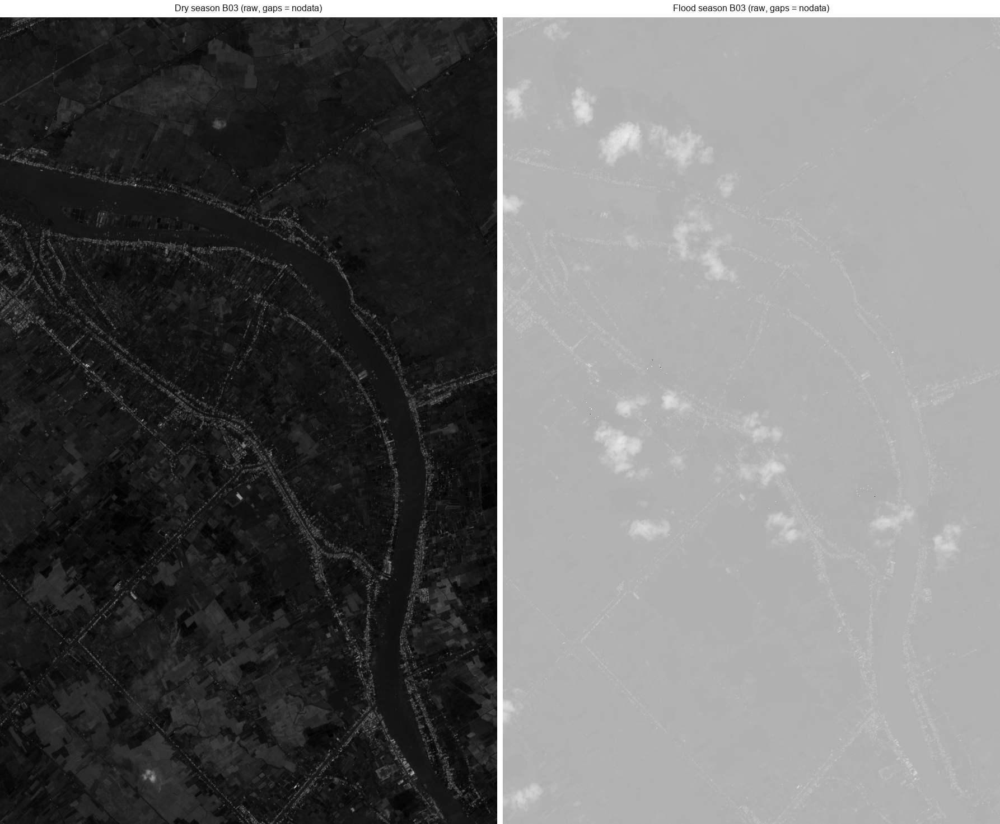

In [24]:
#@title <font color=#1B7192> Check for nodata gaps before computing NDWI </font>  { display-mode: "form" }
diag_green_dry, _ = fr.load_band(dry_path, band_index=1)
diag_nir_dry, _ = fr.load_band(dry_path, band_index=2)
diag_green_flood, _ = fr.load_band(flood_path, band_index=1)
diag_nir_flood, _ = fr.load_band(flood_path, band_index=2)

def _nodata_pct(arr):
    return 100 * float((arr == 0).sum()) / arr.size

print("Nodata share per band (0 = no valid Sentinel-2 pixel at any date in the window):")
for label, green, nir in [
    ("Dry season", diag_green_dry, diag_nir_dry),
    ("Flood season", diag_green_flood, diag_nir_flood),
]:
    print(f"  {label:13s} B03: {_nodata_pct(green):5.1f}%   B08: {_nodata_pct(nir):5.1f}%")

# Raw B03 panels (before NDWI) -- shows exactly where the composite has no valid
# pixel, independent of anything the NDWI/classification code does below.
raw_dry_png = save_array_png(
    colorize_array(np.where(diag_green_dry == 0, np.nan, diag_green_dry), "gray"),
    OUTPUT_DIR / "_raw_dry_b03.png",
)
add_caption(raw_dry_png, "Dry season B03 (raw, gaps = nodata)")
raw_flood_png = save_array_png(
    colorize_array(np.where(diag_green_flood == 0, np.nan, diag_green_flood), "gray"),
    OUTPUT_DIR / "_raw_flood_b03.png",
)
add_caption(raw_flood_png, "Flood season B03 (raw, gaps = nodata)")

raw_check_path = OUTPUT_DIR / "_raw_band_check.png"
hstack_images([raw_dry_png, raw_flood_png], raw_check_path)
display(Image(str(raw_check_path)))

**If a large fraction is missing** (rule of thumb: more than ~15-20% nodata anywhere
this workshop's AOIs are used), fix the *input* before touching anything downstream:

- widen `FLOOD_START`/`FLOOD_END` to 6-8 weeks instead of 1 month — more candidate
  scenes for the median to draw on
- raise `MAX_CLOUD` (e.g. 50-60) — the composite is a *median*, so a few extra cloudy
  scenes get outvoted by the clear ones rather than corrupting the result outright
- as a last resort, shift the window a few weeks — the flood peak varies year to year

Then re-run Section 4's download cell and this check before moving on to Section 5.

## 5. Compute NDWI & classify water per date

Band order in each composite matches `rs.S2_WATER_BANDS = ["B03", "B08"]`: band 1 =
Green, band 2 = NIR. `NDWI_THRESHOLD = 0.0` is the McFeeters (1996) default — raise it
(e.g. `0.1`) if the dry-season mask is picking up damp non-water pixels (wet soil, thin
cloud shadow) as false water.

In [25]:
NDWI_THRESHOLD = 0.0    #@param {type:"number"}

green_dry, profile = fr.load_band(dry_path, band_index=1)
nir_dry, _ = fr.load_band(dry_path, band_index=2)
green_flood, _ = fr.load_band(flood_path, band_index=1)
nir_flood, _ = fr.load_band(flood_path, band_index=2)
print(f"CRS: {profile.get('crs')}")

green_dry, nir_dry = fr.normalize_band(green_dry), fr.normalize_band(nir_dry)
green_flood, nir_flood = fr.normalize_band(green_flood), fr.normalize_band(nir_flood)

ndwi_dry = fr.compute_ndwi(green_dry, nir_dry)
ndwi_flood = fr.compute_ndwi(green_flood, nir_flood)

water_dry = fr.classify_water(ndwi_dry, threshold=NDWI_THRESHOLD)
water_flood = fr.classify_water(ndwi_flood, threshold=NDWI_THRESHOLD)

print(f"NDWI  dry={np.nanmean(ndwi_dry):+.3f}  flood={np.nanmean(ndwi_flood):+.3f}")
print(f"Water pixels  dry={int(water_dry.sum()):,}  flood={int(water_flood.sum()):,}")

CRS: EPSG:32648
NDWI  dry=-0.415  flood=-0.305
Water pixels  dry=93,792  flood=357,190


## 6. Combine into flood-risk classes

`classify_flood_risk` compares the two binary water masks pixel-by-pixel. Class **2**
(dry season land → flood season water) is the actual flood signal. Class **3** is the
reverse and is a data-quality flag, not a real recession — see the module docstring and
Section 10.

In [26]:
classified = fr.classify_flood_risk(water_dry, water_flood)

total = classified.size
n_dry = int((classified == 0).sum())
n_permanent = int((classified == 1).sum())
n_flood = int((classified == 2).sum())
n_recession = int((classified == 3).sum())

pct_dry = 100 * n_dry / total
pct_permanent = 100 * n_permanent / total
pct_flood = 100 * n_flood / total
pct_recession = 100 * n_recession / total

print(f"Dry land (both dates)      : {pct_dry:.1f}%")
print(f"Permanent water            : {pct_permanent:.1f}%")
print(f"Seasonal flood water       : {pct_flood:.1f}%  <- the flood signal")
print(f"Recession (check for noise): {pct_recession:.1f}%")

Dry land (both dates)      : 71.5%
Permanent water            : 6.7%
Seasonal flood water       : 21.2%  <- the flood signal
Recession (check for noise): 0.6%


## 6b. Cross-check against ESA WorldCover permanent water

Independent second opinion on which pixels are *really* permanent water, using
[ESA WorldCover 10m (2021)](https://esa-worldcover.org/) — a separately-trained global
classifier, not derived from this notebook's own Sentinel-2 dates, so agreement between
the two is a real signal rather than circular. Fetched directly from WorldCover's public
AWS bucket via `sitex.data.landcover` (promoted from
[`00-Data-Acquisition_LandCover.ipynb`](../documentations/00-Data-Acquisition_LandCover.ipynb)) —
no Google Earth Engine account needed.

In [27]:
#@title <font color=#1B7192> Fetch WorldCover & align to this grid </font>  { display-mode: "form" }
wc_path = LC_DIR / f"esa_worldcover_2021_{aoi.slug}.tif"
lc.fetch_worldcover_clip(aoi, wc_path)

wc_aligned = lc.align_categorical_to_grid(wc_path, profile["transform"], profile["crs"], classified.shape)
wc_permanent_water = wc_aligned == lc.WC_PERMANENT_WATER_CLASS
print(f"WorldCover permanent-water pixels on this grid: {int(wc_permanent_water.sum()):,} "
      f"({100 * wc_permanent_water.sum() / wc_permanent_water.size:.1f}% of AOI)")

WorldCover permanent-water pixels on this grid: 88,852 (6.9% of AOI)


**Reading the agreement stats:** high agreement on class 1 confirms the NDWI-derived
permanent water is real. A high `class3_recession_confirmed_permanent_by_landcover_pct`
is exactly the noise-vs-signal question from Section 10 answered directly — it means
most of those "recession" pixels are places WorldCover already calls permanent water,
i.e. cloud contamination in the dry-season NDWI, not a real disappearance. Class 2
(seasonal flood) is reported here but **never auto-corrected** — see
`refine_with_landcover_water`'s docstring for why.

In [28]:
agreement = fr.landcover_agreement_stats(classified, wc_permanent_water)
for k, v in agreement.items():
    line = f"n/a (class empty)" if np.isnan(v) else f"{v:.1f}%"
    print(f"  {k:<52s}: {line}")

classified_before_crosscheck = classified.copy()
classified = fr.refine_with_landcover_water(classified, wc_permanent_water)
n_upgraded = int((classified != classified_before_crosscheck).sum())
print(f"\n{n_upgraded:,} pixels reclassified to permanent water on WorldCover's confirmation "
      f"(clears cloud-noise 'recession' pixels and 'dry' pixels NDWI missed at both dates)")

# Recompute the summary stats so everything from here on (rasters, map, GeoJSON,
# webmap, final summary) reflects the cross-checked classification.
n_dry = int((classified == 0).sum())
n_permanent = int((classified == 1).sum())
n_flood = int((classified == 2).sum())
n_recession = int((classified == 3).sum())
pct_dry = 100 * n_dry / total
pct_permanent = 100 * n_permanent / total
pct_flood = 100 * n_flood / total
pct_recession = 100 * n_recession / total

print(f"\nAfter cross-check:")
print(f"Dry land (both dates)      : {pct_dry:.1f}%")
print(f"Permanent water            : {pct_permanent:.1f}%")
print(f"Seasonal flood water       : {pct_flood:.1f}%  <- the flood signal")
print(f"Recession (residual noise) : {pct_recession:.1f}%")

  class1_permanent_confirmed_by_landcover_pct         : 83.4%
  class3_recession_confirmed_permanent_by_landcover_pct: 28.9%
  class0_dry_but_landcover_says_permanent_pct         : 1.0%
  class2_flood_but_landcover_says_permanent_pct       : 2.1%

11,728 pixels reclassified to permanent water on WorldCover's confirmation (clears cloud-noise 'recession' pixels and 'dry' pixels NDWI missed at both dates)

After cross-check:
Dry land (both dates)      : 70.7%
Permanent water            : 7.6%
Seasonal flood water       : 21.2%  <- the flood signal
Recession (residual noise) : 0.4%


## 7. Save rasters

In [29]:
fr.save_raster(ndwi_dry, profile, OUTPUT_DIR / f"ndwi_dry_{aoi.slug}_{YEAR}.tif")
fr.save_raster(ndwi_flood, profile, OUTPUT_DIR / f"ndwi_flood_{aoi.slug}_{YEAR}.tif")
fr.save_raster(classified.astype(np.float32), profile, OUTPUT_DIR / f"flood_risk_{aoi.slug}_{YEAR}.tif")
print(f"Rasters saved to {OUTPUT_DIR}")

Rasters saved to ..\outputs


## 8. Flood-risk map (PNG panels)

Rendered via `sitex.core.raster_viz` (pure NumPy + PIL), not matplotlib `imshow` — this
project's `gis` conda environment crashes the kernel on any actual matplotlib figure
render, independent of what's plotted.

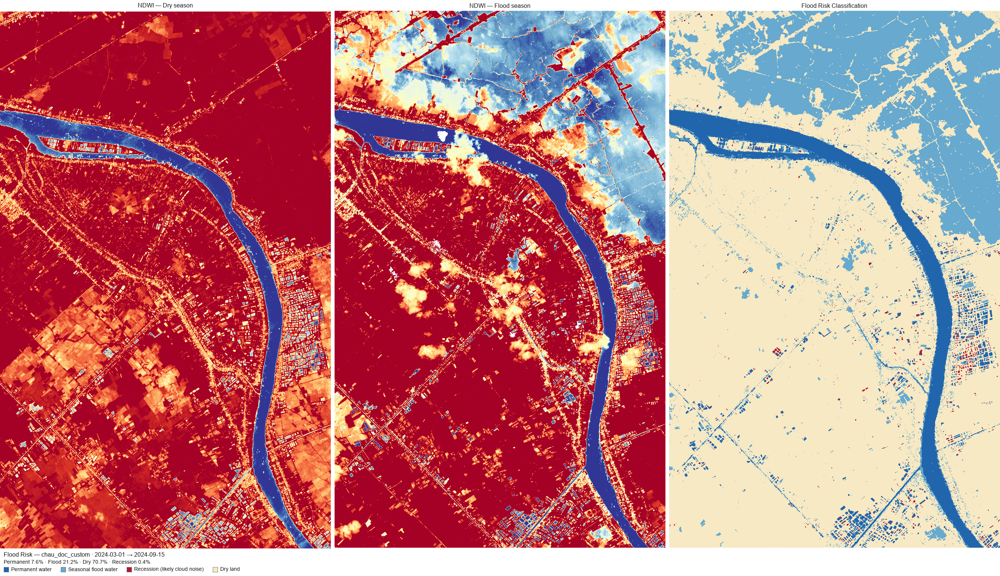

In [30]:
ndwi_dry_png = save_array_png(colorize_array(ndwi_dry, "RdYlBu", vmin=-0.5, vmax=0.5), OUTPUT_DIR / "_ndwi_dry.png")
add_caption(ndwi_dry_png, "NDWI — Dry season")

ndwi_flood_png = save_array_png(colorize_array(ndwi_flood, "RdYlBu", vmin=-0.5, vmax=0.5), OUTPUT_DIR / "_ndwi_flood.png")
add_caption(ndwi_flood_png, "NDWI — Flood season")

classified_png = save_array_png(colorize_categorical(classified, fr.FLOOD_RISK_CLASS_COLORS), OUTPUT_DIR / "_flood_classified.png")
add_caption(classified_png, "Flood Risk Classification")

panels = [ndwi_dry_png, ndwi_flood_png, classified_png]
flood_map_path = OUTPUT_DIR / f"flood_risk_map_{aoi.slug}_{YEAR}.png"
hstack_images(panels, flood_map_path)
add_legend(
    flood_map_path,
    entries=[
        (fr.FLOOD_RISK_CLASS_COLORS[1], "Permanent water"),
        (fr.FLOOD_RISK_CLASS_COLORS[2], "Seasonal flood water"),
        (fr.FLOOD_RISK_CLASS_COLORS[3], "Recession (likely cloud noise)"),
        (fr.FLOOD_RISK_CLASS_COLORS[0], "Dry land"),
    ],
    title=f"Flood Risk — {aoi.slug} · {DRY_START} → {FLOOD_START}",
    subtitle=f"Permanent {pct_permanent:.1f}% · Flood {pct_flood:.1f}% · Dry {pct_dry:.1f}% · Recession {pct_recession:.1f}%",
)
display(Image(str(flood_map_path)))

## 9. Export GeoJSON + interactive webmap

Only water-related classes (permanent, seasonal flood, recession) are vectorised — dry
land is not exported as polygons.

In [31]:
geojson_path = OUTPUT_DIR / f"flood_risk_{aoi.slug}_{YEAR}.geojson"
gdf = fr.export_flood_risk_to_geojson(classified, profile, geojson_path)
print(f"GeoJSON exported → {geojson_path} ({len(gdf):,} features)")

webmap = fr.build_flood_risk_webmap(
    gdf,
    center=(local_lat, local_lon),
    dry_date=DRY_START,
    flood_date=FLOOD_START,
    pct_permanent=pct_permanent,
    pct_flood=pct_flood,
    pct_dry=pct_dry,
)
html_path = OUTPUT_DIR / f"flood_risk_map_{aoi.slug}_{YEAR}.html"
webmap.save(str(html_path))
print(f"Interactive map saved → {html_path}")
webmap

GeoJSON exported → ..\outputs\flood_risk_chau_doc_custom_2024.geojson (13,369 features)
Interactive map saved → ..\outputs\flood_risk_map_chau_doc_custom_2024.html


## 10. Summary

In [ ]:
summary = {
    "aoi": aoi.slug,
    "dry_season_window": f"{DRY_START} → {DRY_END}",
    "flood_season_window": f"{FLOOD_START} → {FLOOD_END}",
    "ndwi_threshold": NDWI_THRESHOLD,
    "dry_land_pct": round(pct_dry, 2),
    "permanent_water_pct": round(pct_permanent, 2),
    "seasonal_flood_water_pct": round(pct_flood, 2),
    "recession_flag_pct": round(pct_recession, 2),
}
for k, v in summary.items():
    print(f"  {k:<24s}: {v}")

  aoi                     : chau_doc_custom
  dry_season_window       : 2024-03-01 → 2024-03-31
  flood_season_window     : 2024-09-15 → 2024-11-15
  ndwi_threshold          : 0.0
  dry_land_pct            : 83.26
  permanent_water_pct     : 2.36
  seasonal_flood_water_pct: 11.74
  recession_flag_pct      : 2.64


---
## Notes

- **This is a seasonal comparison, not single-event flood detection.** The dry-season
  window is a ~1-month median composite and the flood-season window is ~2 months (see
  Section 4 — widened because Châu Đốc's flood season overlaps its rainy season, so a
  narrower window left large nodata gaps), so this shows *where water regularly appears
  during flood season* (the *mùa nước nổi* footprint), not the extent of one specific
  flood event on one specific day. For a specific event date, the SAR-based approach
  (like the `radar-based-flood-mapping` reference notebook, adapted with
  `COPERNICUS/S1_GRD` on Google Earth Engine instead of snappy — see the workshop status
  notes) is the more appropriate tool, precisely because it isn't blocked by cloud cover
  on the day that matters.
- **If a composite comes back with large nodata gaps**, Section 4b's diagnostic will
  show it directly. The `MAX_CLOUD` filter is scene-level, not per-pixel — a scene can
  pass it while still being locally cloudy over this small an AOI. Widen the date
  window, raise `MAX_CLOUD` further, or shift it — the expected failure mode for optical
  data during a wet season, not a bug.
- **Class 3 ("recession") pixels are cross-checked against ESA WorldCover, not just
  flagged.** Section 6b fetches WorldCover 2021's independent permanent-water class and
  reclassifies any class-3 (or class-0) pixel it confirms as permanent water back to
  class 1 — cloud contamination in one date's NDWI composite is a far more likely
  explanation than a permanent water body genuinely appearing or disappearing between
  the two dates. Whatever remains in class 3 after that cross-check is the pixels
  *neither* NDWI nor WorldCover agree are permanent water — worth a visual look in the
  webmap, but a much smaller and more trustworthy residual than before the cross-check.
  Class 2 (the actual flood signal) is deliberately never auto-corrected by the
  cross-check, even where WorldCover disagrees — see `refine_with_landcover_water`'s
  docstring for why, and `landcover_agreement_stats`'s
  `class2_flood_but_landcover_says_permanent_pct` in Section 6b's output for how often
  that disagreement happens.